In [1]:
import geopandas as gpd
import matplotlib as plt
import pandas as pd
import os
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from shapely.geometry import Point
import mapclassify as mc
%matplotlib inline

import seaborn as sns
plt.style.use('seaborn-v0_8')
plt.rcParams['figure.dpi'] = 160

In [2]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


In [3]:
import esda
import pandas as pd
import geopandas as gpd
from geopandas import GeoDataFrame
import libpysal as lps
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point
%matplotlib inline

## Combine eco data and chicago community boundaries 

In [5]:
boundaries_fp='./data/geo_export.shp'
ecodata_fp='./data/econ/econ15.csv'

boundaries=gpd.read_file(boundaries_fp)

ecodata=pd.read_csv(ecodata_fp)

In [6]:
ecodata

,WHITE,HISP,BLACK,ASIAN,OTHER,UND19,A20_34,A35_49,A50_64,A65_79,...,INC_25_50K,INC_50_75K,INC_75_100K,INC_100_150K,INC_GT_150,MEDINC,GEOG,TOT_POP,TOT_HH,MED_ROOMS
0,15392,27953,2147,7324,1202,14769,15060,12305,7443,3201,...,3926,3032,2036,1739,1509,50085.24833,Albany Park,54018,16609,5.365877
1,2906,10708,205,203,84,4513,3415,2840,2068,921,...,1279,784,363,386,166,43759.61538,Archer Heights,14106,3802,5.569656
2,1624,517,1670,9855,510,2955,3080,2768,2849,1472,...,943,769,406,303,148,24101.02740,Armour Square,14176,5244,4.840925
3,6814,14699,20940,156,212,12864,8428,8940,8517,2849,...,2552,2481,2135,2488,979,67286.12167,Ashburn,42821,12827,6.469570
4,127,653,47594,118,442,14355,8680,9236,9002,5781,...,4401,2678,1412,870,380,29167.30769,Auburn Gresham,48934,17315,5.880000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,5306,26576,1097,108,112,11064,8277,6598,4746,1548,...,2826,1665,1389,935,307,47639.27577,West Lawn,33199,8931,6.246664
73,314,1224,28002,52,215,9671,5382,5449,5121,3280,...,2447,1541,982,646,247,35733.47107,West Pullman,29808,9283,6.335035
74,31630,13994,7529,17702,2450,20220,15438,15029,13424,6728,...,6635,4165,2671,2723,1722,47048.12638,West Ridge,73305,24169,5.473443
75,48847,23984,6490,3271,1967,14823,36486,18868,9135,3803,...,6459,5950,4595,5947,7000,69640.22706,West Town,84559,37413,4.954343


In [7]:
boundaries.community.values

array(['DOUGLAS', 'OAKLAND', 'FULLER PARK', 'GRAND BOULEVARD', 'KENWOOD',
       'LINCOLN SQUARE', 'WASHINGTON PARK', 'HYDE PARK', 'WOODLAWN',
       'ROGERS PARK', 'JEFFERSON PARK', 'FOREST GLEN', 'NORTH PARK',
       'ALBANY PARK', 'PORTAGE PARK', 'IRVING PARK', 'DUNNING',
       'MONTCLARE', 'BELMONT CRAGIN', 'WEST RIDGE', 'HERMOSA', 'AVONDALE',
       'LOGAN SQUARE', 'HUMBOLDT PARK', 'WEST TOWN', 'AUSTIN',
       'WEST GARFIELD PARK', 'EAST GARFIELD PARK', 'NEAR WEST SIDE',
       'NORTH LAWNDALE', 'UPTOWN', 'SOUTH LAWNDALE', 'LOWER WEST SIDE',
       'NEAR SOUTH SIDE', 'ARMOUR SQUARE', 'NORWOOD PARK',
       'NEAR NORTH SIDE', 'LOOP', 'SOUTH SHORE', 'CHATHAM', 'AVALON PARK',
       'SOUTH CHICAGO', 'BURNSIDE', 'CALUMET HEIGHTS', 'ROSELAND',
       'NORTH CENTER', 'PULLMAN', 'SOUTH DEERING', 'EAST SIDE',
       'WEST PULLMAN', 'RIVERDALE', 'HEGEWISCH', 'GARFIELD RIDGE',
       'ARCHER HEIGHTS', 'BRIGHTON PARK', 'MCKINLEY PARK', 'LAKE VIEW',
       'BRIDGEPORT', 'NEW CITY', 'WEST EL

In [8]:
boundaries['GEOG']=boundaries['community'].str.lower()
ecodata['GEOG']=ecodata['GEOG'].str.lower()

In [9]:
# ecodata['GEOID']=ecodata['GEOID'].astype('int')
# boundaries['area_numbe']=boundaries['area_numbe'].astype(int)

In [10]:
boundaries_data=boundaries.merge(ecodata, how='left',left_on='GEOG',right_on='GEOG')

## econ data

In [11]:
boundaries_data.head()

,perimeter,community,shape_len,shape_area,area,comarea,area_numbe,area_num_1,comarea_id,geometry,...,INC_LT_25K,INC_25_50K,INC_50_75K,INC_75_100K,INC_100_150K,INC_GT_150,MEDINC,TOT_POP,TOT_HH,MED_ROOMS
0,0.0,DOUGLAS,31027.054510,4.600462e+07,0.0,0.0,35,35,0.0,"POLYGON ((-87.60914 41.84469, -87.60915 41.844...",...,3902.0,1925.0,1610.0,669.0,553.0,327.0,33574.76636,19074.0,8986.0,3.938254
1,0.0,OAKLAND,19565.506153,1.691396e+07,0.0,0.0,36,36,0.0,"POLYGON ((-87.59215 41.81693, -87.59231 41.816...",...,1595.0,533.0,278.0,98.0,143.0,178.0,21305.66802,6247.0,2825.0,4.366081
2,0.0,FULLER PARK,25339.089750,1.991670e+07,0.0,0.0,37,37,0.0,"POLYGON ((-87.62880 41.80189, -87.62879 41.801...",...,705.0,281.0,73.0,75.0,37.0,15.0,16965.64885,2867.0,1186.0,5.170927
3,0.0,GRAND BOULEVARD,28196.837157,4.849250e+07,0.0,0.0,38,38,0.0,"POLYGON ((-87.60671 41.81681, -87.60670 41.816...",...,4392.0,1977.0,1400.0,890.0,675.0,531.0,30523.25581,22386.0,9865.0,5.141348
4,0.0,KENWOOD,23325.167906,2.907174e+07,0.0,0.0,39,39,0.0,"POLYGON ((-87.59215 41.81693, -87.59215 41.816...",...,3368.0,2124.0,1152.0,813.0,810.0,878.0,37056.45161,18021.0,9145.0,4.470792


In [12]:
# ecodata = boundaries_data[[
# #     "GEOID", 
#         "geometry","community","TOT_POP",
#            "LT_HS", "HS", "SOME_COLL", "ASSOC", "BACH", "GRAD_PROF", "UND5",  ## Educational Attainment
#            "A5_19", "A20_34", "A35_49", "A50_64", "A65_74", "A75_84", "OV85",  ##ages
#            "IN_LBFRC", "EMP", "UNEMP", "NOT_IN_LBFRC",     ## employment status
#            "INC_LT_25K", "INC_25_50K", "INC_50_75K", "INC_75_100K", "INC_100_150K", "INC_GT_150", "MEDINC", "INCPERCAP", ## Household Income
# #            "COMPUTER", "ONLY_SMARTPHONE", "NO_COMPUTER", "INTERNET", "BROADBAND", "NO_INTERNET",   ## Household Computer and Internet Access
# #            "TRANSIT_LOW_PCT", "TRANSIT_MOD_PCT", "TRANSIT_HIGH_PCT",  ## Transit Availability of Resident and Job Locations
# #            "WALKABLE_LOW_PCT", "WALKABLE_MOD_PCT", "WALKABLE_HIGH_PCT"  ## Walkability of Resident and Job Locations
#            ]]  
ecodata=boundaries_data

In [13]:
ecodata.describe()

,perimeter,shape_len,shape_area,area,comarea,comarea_id,WHITE,HISP,BLACK,ASIAN,...,INC_LT_25K,INC_25_50K,INC_50_75K,INC_75_100K,INC_100_150K,INC_GT_150,MEDINC,TOT_POP,TOT_HH,MED_ROOMS
count,77.0,77.000000,7.700000e+01,77.0,77.0,77.0,75.000000,75.000000,75.000000,75.000000,...,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000,75.000000
mean,0.0,44397.606964,8.361453e+07,0.0,0.0,0.0,11235.986667,10297.120000,11448.960000,1954.640000,...,3910.280000,3123.160000,2168.626667,1430.506667,1478.666667,1311.920000,45707.623904,35510.066667,13423.173333,5.466485
std,0.0,20090.463816,5.494626e+07,0.0,0.0,0.0,15385.503695,13302.463937,14681.448258,3189.459696,...,2779.563394,2110.365045,1646.669011,1230.087158,1617.583661,2411.627457,19527.397788,22494.728649,10370.649673,0.723288
min,0.0,18137.944253,1.691396e+07,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,542.000000,158.000000,73.000000,28.000000,0.000000,0.000000,14008.458650,2837.000000,962.000000,3.724824
25%,0.0,31948.598840,4.976964e+07,0.0,0.0,0.0,696.500000,664.000000,810.500000,92.500000,...,1713.500000,1428.000000,1076.000000,618.000000,502.000000,185.000000,31498.959165,18903.000000,6603.500000,5.095248
50%,0.0,43229.372704,7.963575e+07,0.0,0.0,0.0,4146.000000,5079.000000,6490.000000,365.000000,...,3420.000000,2595.000000,1698.000000,1035.000000,870.000000,394.000000,42572.765070,31924.000000,10555.000000,5.586128
75%,0.0,49478.427771,9.885317e+07,0.0,0.0,0.0,15751.000000,14533.500000,17751.000000,2770.500000,...,5607.000000,4353.000000,2778.500000,1955.000000,1943.500000,1247.000000,58239.592355,50401.000000,16456.500000,5.875585
max,0.0,173625.984660,3.718356e+08,0.0,0.0,0.0,77336.000000,61488.000000,82991.000000,17702.000000,...,13086.000000,9250.000000,8333.000000,6281.000000,8319.000000,13889.000000,92331.670820,97997.000000,52539.000000,7.280157


In [14]:
# bl_df = pd.read_csv('data/berlin-listings.csv')
# geometry = [Point(xy) for xy in zip(bl_df.longitude, bl_df.latitude)]
# crs = {'init': 'epsg:4326'}
# bl_gdf = GeoDataFrame(bl_df, crs=crs, geometry=geometry)

# bl_gdf['price'] = bl_gdf['price'].astype('float32')
# sj_gdf = gpd.sjoin(gdf, bl_gdf, how='inner', op='intersects', lsuffix='left', rsuffix='right')
# median_price_gb = sj_gdf['price'].groupby([sj_gdf['neighbourhood_group']]).mean()
# gdf = gdf.join(median_price_gb, on='neighbourhood_group')
# gdf.rename(columns={'price': 'median_pri'}, inplace=True)

# pd.isnull(gdf['median_pri']).sum()
# gdf['median_pri'].fillna((gdf['median_pri'].mean()), inplace=True)

In [15]:
ecodata[['community','MEDINC']]

,community,MEDINC
0,DOUGLAS,33574.76636
1,OAKLAND,21305.66802
2,FULLER PARK,16965.64885
3,GRAND BOULEVARD,30523.25581
4,KENWOOD,37056.45161
...,...,...
72,MOUNT GREENWOOD,88023.88935
73,MORGAN PARK,63541.66667
74,OHARE,NaN
75,EDGEWATER,44299.35012


In [16]:
ecodata['MEDINC'].fillna(0., inplace=True)

/home/siji/anaconda3/envs/gnn/lib/python3.9/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


<Axes: >

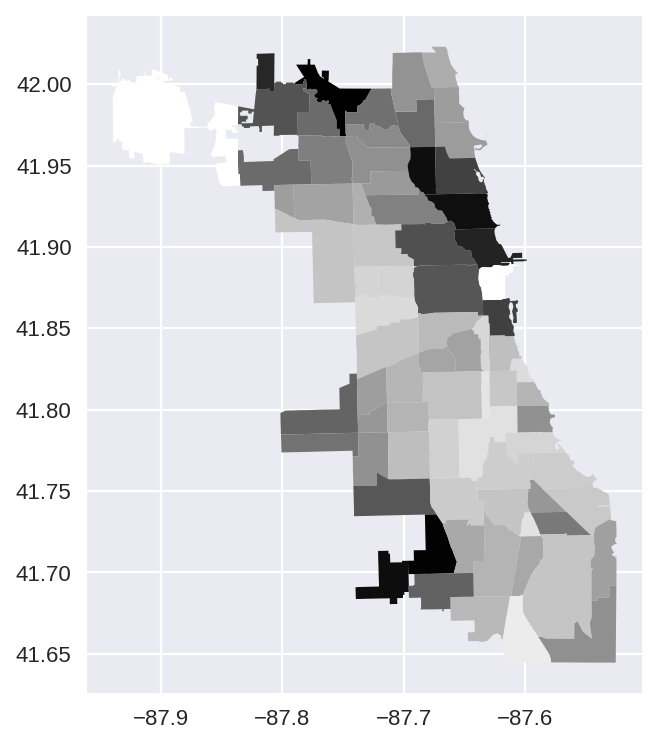

In [17]:
ecodata.plot(column='MEDINC')

<AxesSubplot:>

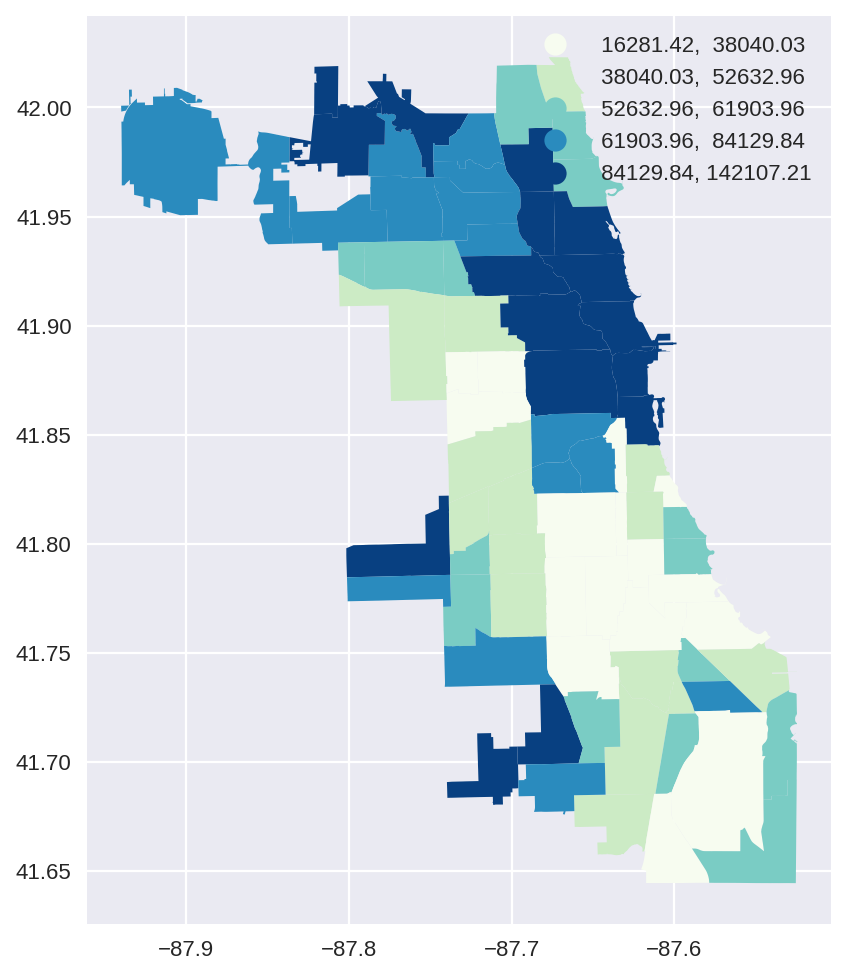

In [54]:
fig, ax = plt.subplots(figsize=(6,8), subplot_kw={'aspect':'equal'})
ecodata.plot(column='MEDINC', scheme='Quantiles', k=5, cmap='GnBu', legend=True, ax=ax)
#ax.set_xlim(150000, 160000)
#ax.set_ylim(208000, 215000)

In [18]:
df=ecodata
wq =  lps.weights.Queen.from_dataframe(df)
wq.transform = 'r'

/tmp/ipykernel_837589/1819243475.py:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  wq =  lps.weights.Queen.from_dataframe(df)


In [19]:
wq.weights

{0: [0.25, 0.25, 0.25, 0.25],
 1: [0.3333333333333333, 0.3333333333333333, 0.3333333333333333],
 2: [0.16666666666666666,
  0.16666666666666666,
  0.16666666666666666,
  0.16666666666666666,
  0.16666666666666666,
  0.16666666666666666],
 3: [0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285],
 4: [0.25, 0.25, 0.25, 0.25],
 5: [0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125],
 6: [0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285,
  0.14285714285714285],
 7: [0.25, 0.25, 0.25, 0.25],
 8: [0.25, 0.25, 0.25, 0.25],
 9: [0.5, 0.5],
 10: [0.3333333333333333, 0.3333333333333333, 0.3333333333333333],
 11: [0.16666666666666666,
  0.16666666666666666,
  0.16666666666666666,
  0.16666666666666666,
  0.16666666666666666,
  0.16666666666666666],
 12: [0.25, 0.25, 0.25, 0.25],
 13: [0.166666666666666

In [20]:
y=df['MEDINC']
ylag=lps.weights.lag_spatial(wq,y) # apply the spatial weights on the attribute
ylag

array([37423.282235  , 33718.15792667, 28002.91363833, 28598.15817143,
       29753.1171975 , 56742.41028375, 29168.35556429, 27908.6640175 ,
       30887.6355525 , 45673.73825   , 71566.63925667, 56614.80463667,
       62646.5802525 , 66953.62020333, 56034.97714571, 61169.76325571,
       34946.39943   , 44924.11923667, 43105.853835  , 50901.4987025 ,
       43499.06645571, 56898.3763025 , 59782.6698    , 40856.95318429,
       57535.67313833, 33914.24923167, 27688.8877275 , 43173.149076  ,
       41614.60819625, 36148.94945   , 66668.490285  , 40599.76453   ,
       42575.18043125, 32162.381906  , 42933.67565286, 58243.5583975 ,
       56117.1900775 , 74222.99723   , 32061.28219   , 35797.72441667,
       32079.91226   , 40956.300176  , 40557.50557333, 31557.645622  ,
       34293.68163375, 57792.1782325 , 25411.52057   , 35762.83639429,
       36469.39536333, 38339.9895    , 38736.310032  , 29563.19894   ,
       45336.155514  , 44252.94034   , 38324.30685   , 35725.663698  ,
      

/home/siji/anaconda3/envs/gnn/lib/python3.9/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


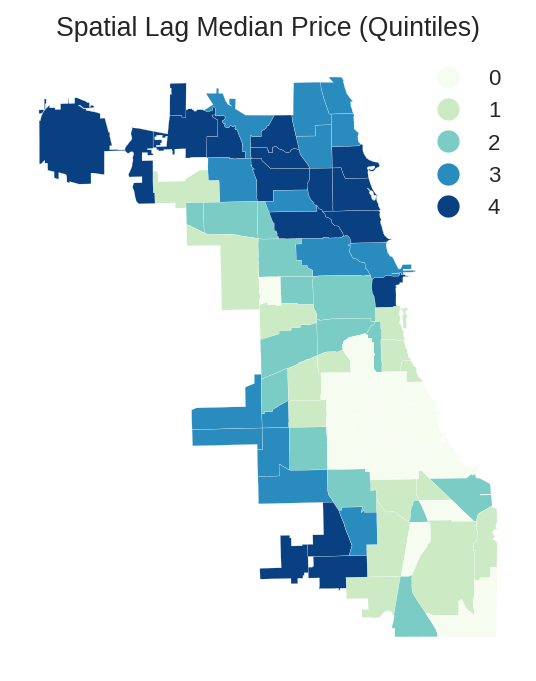

In [21]:
import mapclassify as mc
ylagq5 = mc.Quantiles(ylag, k=5)
f, ax = plt.subplots(1, figsize=(5, 5))
df.assign(cl=ylagq5.yb).plot(column='cl', categorical=True, \
        k=5, cmap='GnBu', linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()
plt.title("Spatial Lag Median Price (Quintiles)")

plt.show()

/home/siji/anaconda3/envs/gnn/lib/python3.9/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):
/home/siji/anaconda3/envs/gnn/lib/python3.9/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):


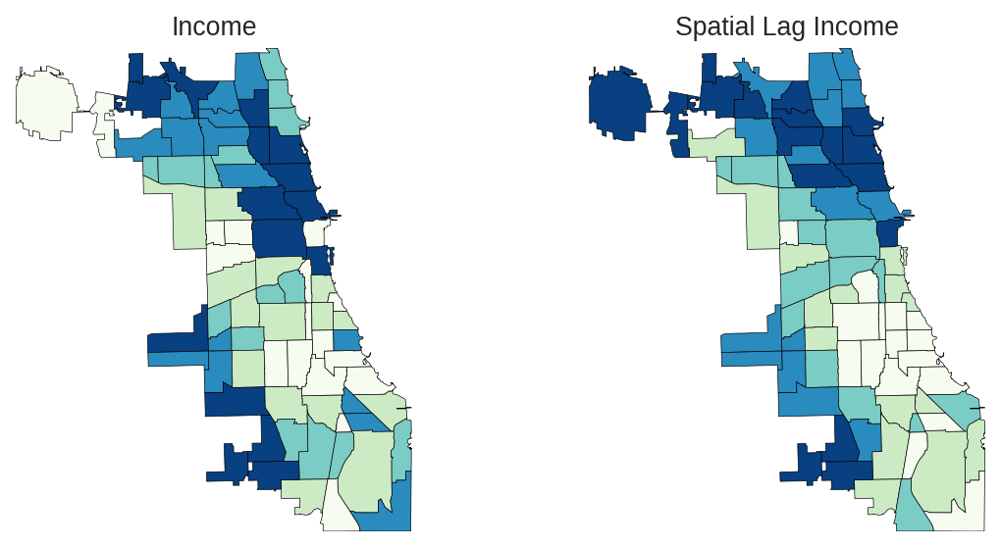

In [22]:
# the quintile map for the spatial lag is a local smoother, enhancing the impression of spatial similarity
df['lag_median_pri'] = ylag
f,ax = plt.subplots(1,2,figsize=(2.16*4,4))
df.plot(column='MEDINC', ax=ax[0], edgecolor='k',
        scheme="quantiles",  k=5, cmap='GnBu')
ax[0].axis(df.total_bounds[np.asarray([0,2,1,3])])
ax[0].set_title("Income")
df.plot(column='lag_median_pri', ax=ax[1], edgecolor='k',
        scheme='quantiles', cmap='GnBu', k=5)
ax[1].axis(df.total_bounds[np.asarray([0,2,1,3])])
ax[1].set_title("Spatial Lag Income")
ax[0].axis('off')
ax[1].axis('off')
plt.show()

In [66]:
y.median()

58064.13302

In [67]:
yb=y>y.median()
sum(yb)

38

In [68]:
labels=["Low","High"]
yb=[labels[i] for i in 1*yb]
df['yb']=yb

/home/siji/anaconda3/envs/gnn/lib/python3.9/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<AxesSubplot:>

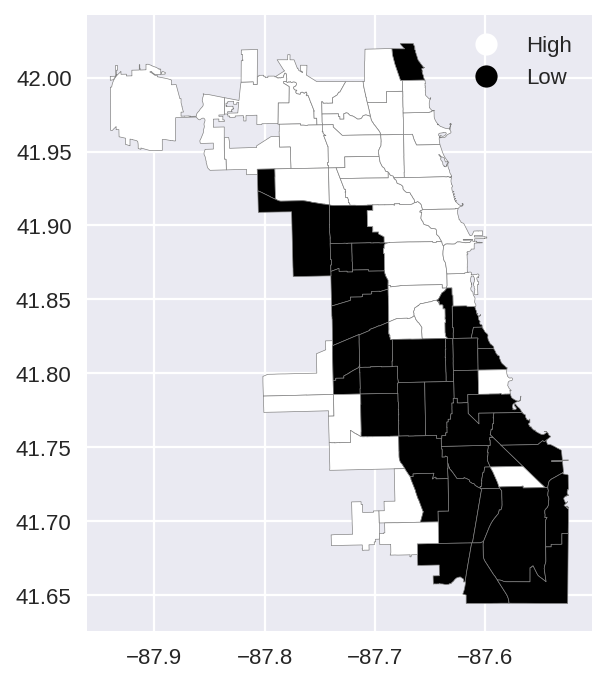

In [70]:
fig, ax = plt.subplots(figsize=(5,5), subplot_kw={'aspect':'equal'})
df.plot(column='yb', cmap='binary', edgecolor='grey', legend=True, ax=ax)

In [72]:
yb = 1 * (y > y.median()) # convert back to binary
wq =  lps.weights.Queen.from_dataframe(df)
wq.transform = 'b'
np.random.seed(12345)
jc = esda.join_counts.Join_Counts(yb, wq)

/tmp/ipykernel_3794913/4190584128.py:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  wq =  lps.weights.Queen.from_dataframe(df)


In [77]:
print(f'{jc.bb}')
print(f'{jc.ww}')
print(f'{jc.bw}')
print(f'{jc.bb+jc.ww+jc.bw}')
print(f'{wq.s0/2}') # the unique number of joins in the spatial weights object
print(f'{jc.mean_bb}') # complete spatial randomness CSR

69.0
79.0
49.0
197.0
197.0
47.028028028028025


/tmp/ipykernel_3794913/1737335815.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(jc.sim_bb, shade=True)


Text(0.5, 0, 'BB Counts')

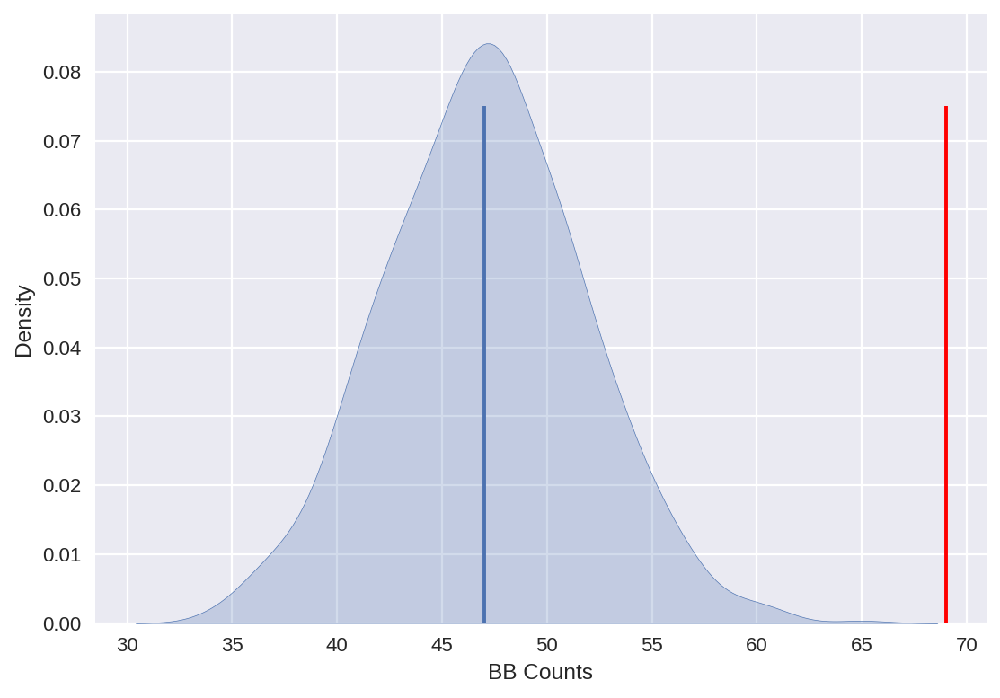

In [80]:
# the observed count 69 vs CSR count 47
sns.kdeplot(jc.sim_bb, shade=True)
plt.vlines(jc.bb, 0, 0.075, color='r')
plt.vlines(jc.mean_bb, 0,0.075)
plt.xlabel('BB Counts')

In [81]:
jc.p_sim_bb

0.001

In [82]:
# cont case
y=df['MEDINC']
wq.transform='r'
mi=esda.moran.Moran(y,wq)
mi.I

0.5747655559553753

/tmp/ipykernel_3794913/1835929999.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(mi.sim, shade=True)


Text(0.5, 0, "Moran's I")

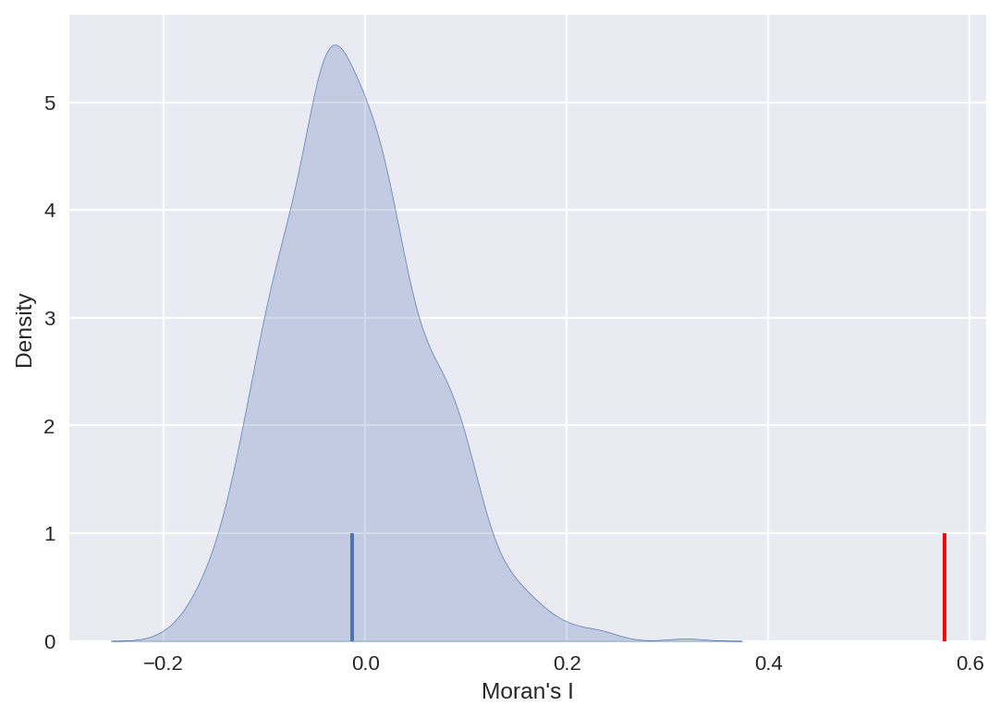

In [84]:
sns.kdeplot(mi.sim, shade=True)
plt.vlines(mi.I, 0, 1, color='r')
plt.vlines(mi.EI, 0,1)
plt.xlabel("Moran's I")

In [85]:
mi.p_sim

0.001

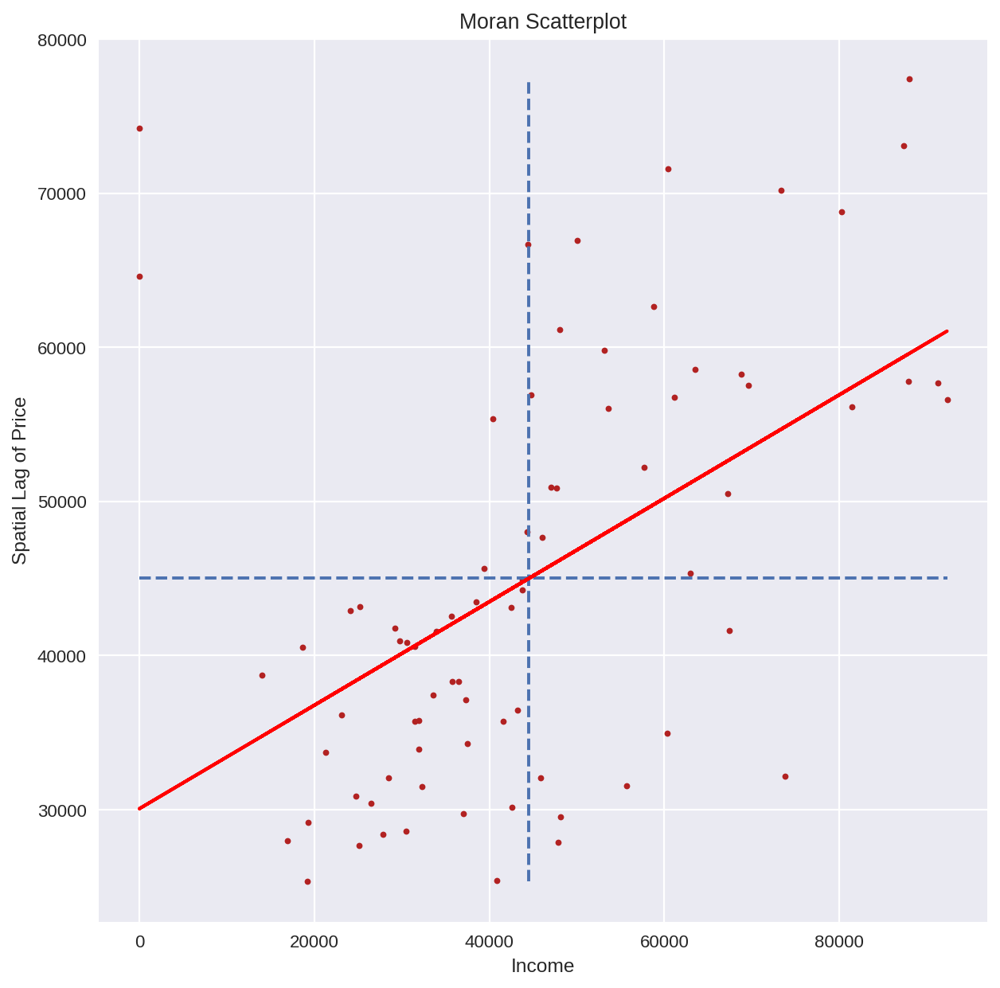

In [32]:
income = df['MEDINC']
b, a = np.polyfit(income, ylag, 1)
f, ax = plt.subplots(1, figsize=(9, 9))

plt.plot(income, ylag, '.', color='firebrick')

 # dashed vert at mean of the price
plt.vlines(income.mean(), ylag.min(), ylag.max(), linestyle='--')
#  # dashed horizontal at mean of lagged price
plt.hlines(ylag.mean(), income.min(), income.max(), linestyle='--')

# red line of best fit using global I as slope
plt.plot(income, a + b*income, 'r')
plt.title('Moran Scatterplot')
plt.ylabel('Spatial Lag of Price')
plt.xlabel('Income')
plt.show()


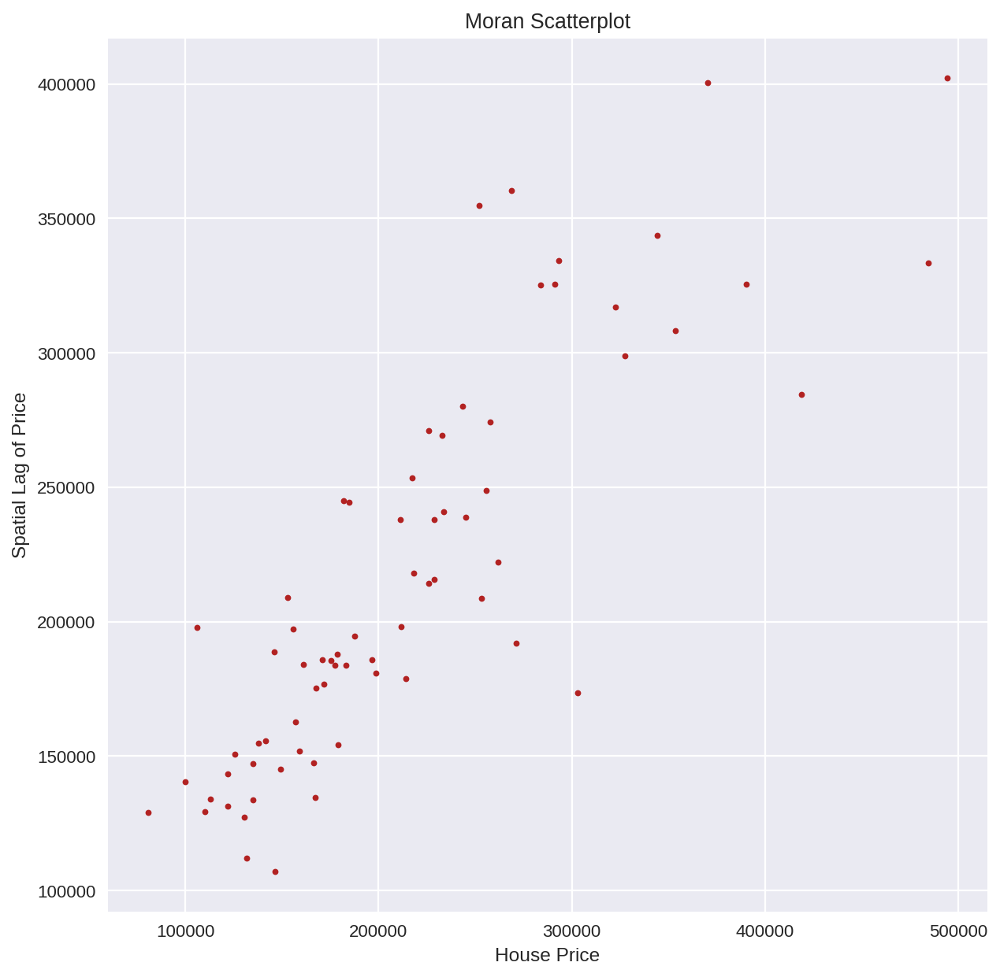

In [40]:
income = df['MED_HV']

ylag=lps.weights.lag_spatial(wq,df['MED_HV']) # apply the spatial weights on the attribute

# b, a = np.polyfit(income, ylag, 1) # SVD did not converge in Linear Least Squares
f, ax = plt.subplots(1, figsize=(9, 9))

plt.plot(income, ylag, '.', color='firebrick')

 # dashed vert at mean of the price
plt.vlines(income.mean(), ylag.min(), ylag.max(), linestyle='--')
#  # dashed horizontal at mean of lagged price
plt.hlines(ylag.mean(), income.min(), income.max(), linestyle='--')

# red line of best fit using global I as slope
# plt.plot(income, a + b*income, 'r')
plt.title('Moran Scatterplot')
plt.ylabel('Spatial Lag of Price')
plt.xlabel('House Price')
plt.show()


In [91]:
li = esda.moran.Moran_Local(y, wq)
li.q

array([3, 3, 3, 3, 3, 1, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 3, 3, 2, 2, 1,
       1, 3, 1, 3, 3, 2, 1, 3, 2, 3, 2, 1, 3, 1, 1, 1, 3, 3, 3, 3, 3, 4,
       3, 1, 3, 3, 3, 3, 3, 3, 4, 3, 3, 4, 1, 4, 3, 3, 3, 1, 3, 3, 3, 3,
       3, 1, 1, 3, 1, 2, 1, 1, 2, 2, 1])

In [93]:
(li.p_sim<0.05).sum()

32

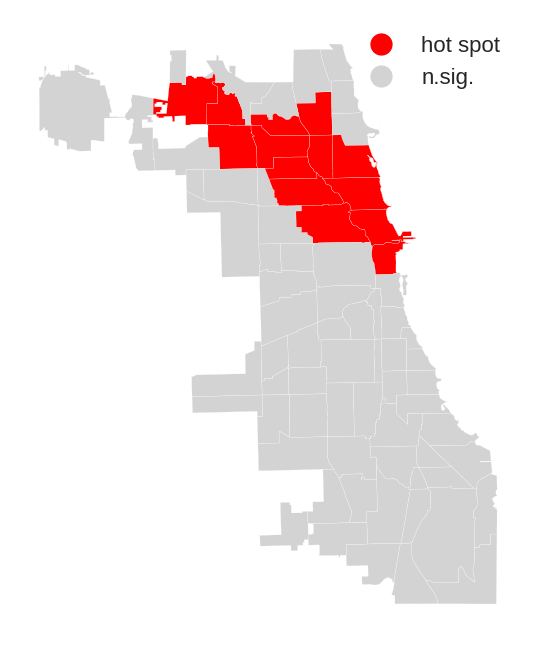

In [95]:
sig = li.p_sim < 0.05
hotspot = sig * li.q==1
coldspot = sig * li.q==3
doughnut = sig * li.q==2
diamond = sig * li.q==4

spots = ['n.sig.', 'hot spot']
labels = [spots[i] for i in hotspot*1]

df = df
from matplotlib import colors
hmap = colors.ListedColormap(['red', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(5, 5))
df.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()
plt.show()


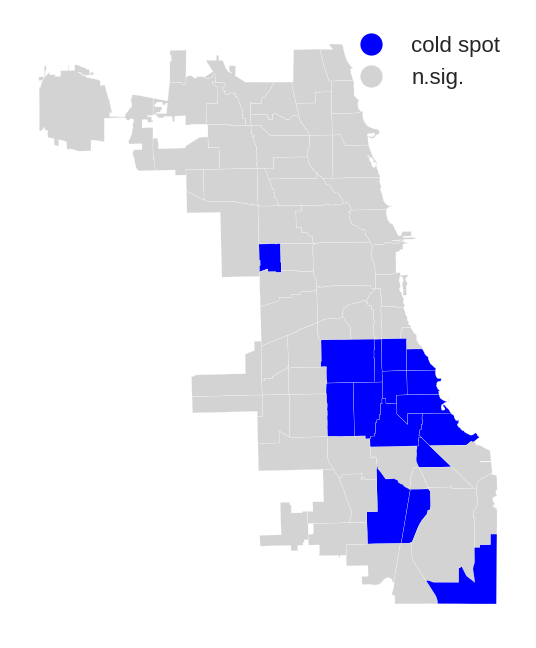

In [97]:
spots = ['n.sig.', 'cold spot']
labels = [spots[i] for i in coldspot*1]

df = df
from matplotlib import colors
hmap = colors.ListedColormap(['blue', 'lightgrey'])
f, ax = plt.subplots(1, figsize=(5, 5))
df.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()
plt.show()

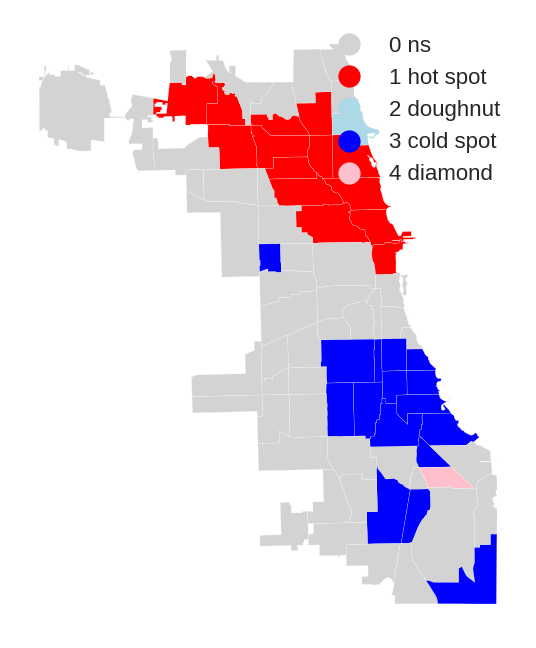

In [99]:
sig = 1 * (li.p_sim < 0.05)
hotspot = 1 * (sig * li.q==1)
coldspot = 3 * (sig * li.q==3)
doughnut = 2 * (sig * li.q==2)
diamond = 4 * (sig * li.q==4)

spots = hotspot + coldspot + doughnut + diamond
spot_labels = [ '0 ns', '1 hot spot', '2 doughnut', '3 cold spot', '4 diamond']
labels = [spot_labels[i] for i in spots]

hmap = colors.ListedColormap([ 'lightgrey', 'red', 'lightblue', 'blue', 'pink'])
f, ax = plt.subplots(1, figsize=(5,5))
df.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)
ax.set_axis_off()
plt.show()

In [25]:
plt.figure(figsize=(20,15))
sns.pairplot(data=ecodata,diag_kind='auto',kind='scatter')
plt.show()

<Figure size 3200x2400 with 0 Axes>

In [9]:
plt.figure(figsize=(15,7))
sns.regplot(data=edadf,x='SalePrice',y='OverallQual')
plt.show()

(77, 40)

In [ ]:
plt.figure(figsize=(20,10))
sns.violinplot(data=edadf,x='TotRmsAbvGrd',y='SalePrice')
plt.title('Violin Plot of Total rooms above ground')
plt.show()

In [ ]:
plt.figure(figsize=(12,7))
sns.scatterplot(data=edadf,x='GarageArea',y='SalePrice',hue='GarageCars')
plt.title('Relationship between Garage area, Garage Cars and House Price ')
plt.show()

In [ ]:
plt.figure(figsize=(20,10))
sns.stripplot(data=edadf,x='YearBuilt',y='SalePrice',hue='OverallQual')
plt.xticks(rotation=90)
plt.show()

Text(0.5, 1.0, 'UNemployment rate vs total population')

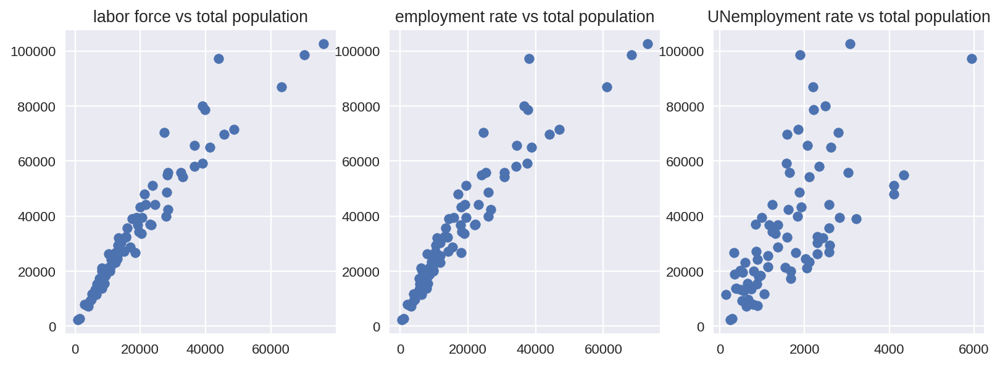

In [97]:
fig, axs = plt.subplots(1, 3, figsize=(12,4))
axs = np.ravel(axs)
i=0
plt.sca(axs[i])
plt.scatter(boundaries_data['IN_LBFRC'],boundaries_data['TOT_POP'])
plt.title('labor force vs total population')

i=1
plt.sca(axs[i])
plt.scatter(boundaries_data['EMP'],boundaries_data['TOT_POP'])
plt.title('employment rate vs total population')

i=2
plt.sca(axs[i])
plt.scatter(boundaries_data['UNEMP'],boundaries_data['TOT_POP'])
plt.title('UNemployment rate vs total population')

Text(0.5, 1.0, 'INCPERCAP vs total pop')

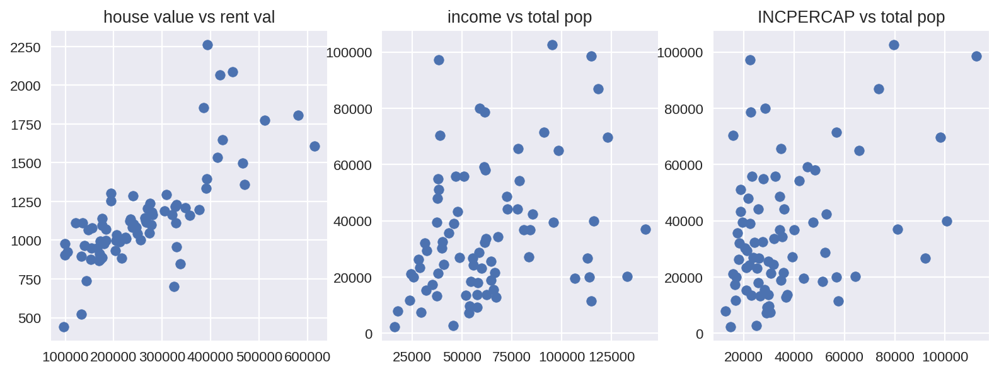

In [98]:
fig, axs = plt.subplots(1, 3, figsize=(12,4))
axs = np.ravel(axs)
i=0
plt.sca(axs[i])
plt.scatter(boundaries_data['MED_HV'],boundaries_data['MED_RENT'])
plt.title('house value vs rent val')

plt.sca(axs[1])
plt.scatter(boundaries_data['MEDINC'],boundaries_data['TOT_POP'])
plt.title('income vs total pop')

plt.sca(axs[2])
plt.scatter(boundaries_data['INCPERCAP'],boundaries_data['TOT_POP'])
plt.title('INCPERCAP vs total pop')


<AxesSubplot:>

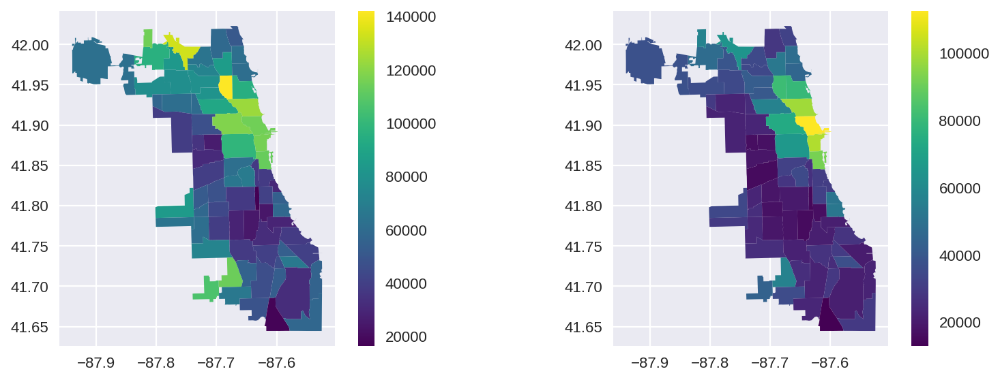

In [103]:
fig, axs = plt.subplots(1, 2, figsize=(12,4))
axs = np.ravel(axs)

boundaries_data.plot(column='MEDINC',cmap=colormap,legend=True,ax=axs[0])
boundaries_data.plot(column='INCPERCAP',cmap=colormap,legend=True,ax=axs[1])

## add libraries

In [104]:
libraries=gpd.read_file('./data/libraries.csv')

In [105]:
def string_to_points(point):
    #Remove bracketsfrom shapely.geometry import Point
    point = point.replace ("(", "")
    point = point.replace (")", "")

    #Parse the location string
    loc = point.split (',')

    #Returns tuple
    return Point(float (loc[1]), float (loc[0]))

In [106]:
libraries['geometry']=libraries['LOCATION'].apply(string_to_points)

In [107]:
libraries.head()

,NAME,HOURS OF OPERATION,CYBERNAVIGATOR,TEACHER IN THE LIBRARY,ADDRESS,CITY,STATE,ZIP,PHONE,WEBSITE,LOCATION,geometry
0,Albany Park,"M, W: 10AM-6PM; TU, TH: 12PM-8PM; F, SA: 9AM-...",Yes,Yes,3401 W. Foster Avenue,CHICAGO,IL,60625,(773) 539-5450,https://www.chipublib.org/locations/3/,"(41.975456, -87.71409)",POINT (-87.71409 41.97546)
1,Altgeld,"M, W: 12PM-8PM; TU, TH: 10AM-6PM; F, SA: 9AM-5...",Yes,Yes,13281 S. Corliss Avenue,CHICAGO,IL,60827,(312) 747-3270,https://www.chipublib.org/locations/4/,"(41.65473021837776, -87.6022302609835)",POINT (-87.60223 41.65473)
2,Archer Heights,"M, W: 12PM-8PM; TU, TH: 10AM-6PM; F, SA: 9AM-5...",No,Yes,5055 S. Archer Avenue,CHICAGO,IL,60632,(312) 747-9241,https://www.chipublib.org/locations/5/,"(41.8012136599335, -87.72649071431441)",POINT (-87.72649 41.80121)
3,Austin,"M, W: 12PM-8PM; TU, TH: 10AM-6PM; F, SA: 9AM-5...",Yes,Yes,5615 W. Race Avenue,CHICAGO,IL,60644,(312) 746-5038,https://www.chipublib.org/locations/6/,"(41.889272153514526, -87.76571186722818)",POINT (-87.76571 41.88927)
4,Austin-Irving,"M, W: 12PM-8PM; TU, TH: 10AM-6PM; F, SA: 9AM-5...",No,Yes,6100 W. Irving Park Road,CHICAGO,IL,60634,(312) 744-6222,https://www.chipublib.org/locations/7/,"(41.95317390064158, -87.77938682073541)",POINT (-87.77939 41.95317)


<AxesSubplot:>

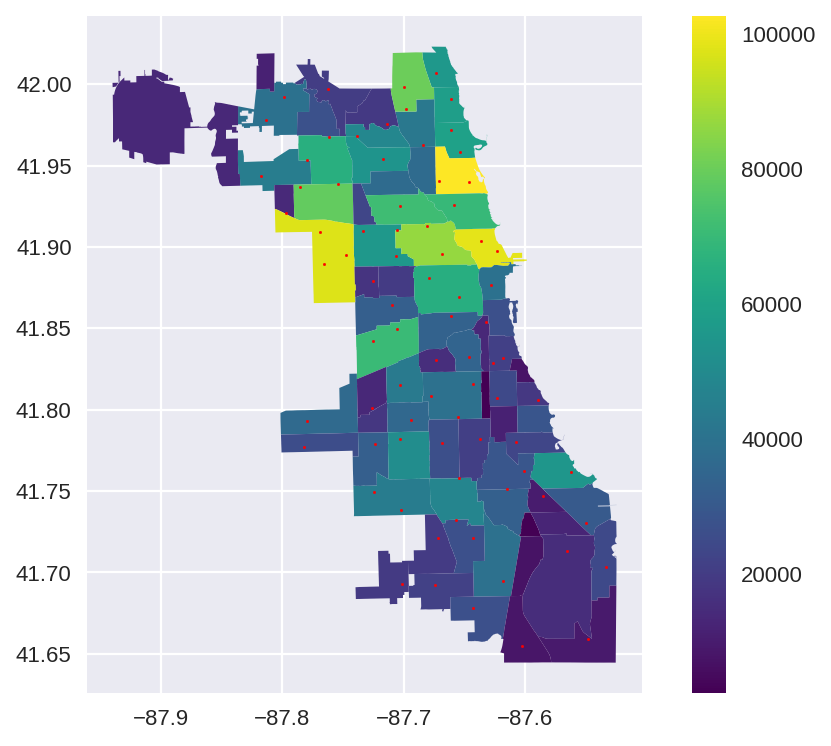

In [109]:
ax=libraries.plot(color='r',markersize=1,zorder=2)
boundaries_data.plot(column='TOT_POP',ax=ax,zorder=1,cmap=colormap,legend=True)

 ## add crime

In [110]:
crime_2015_9=gpd.read_file('./data/Crimes_till20221017.csv')

In [139]:
crime_2015_9.describe()

,CASE#,DATE OF OCCURRENCE,BLOCK,IUCR,PRIMARY DESCRIPTION,SECONDARY DESCRIPTION,LOCATION DESCRIPTION,ARREST,DOMESTIC,BEAT,WARD,FBI CD,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION,geometry
count,257314,257314,257314,257314,257314,257314,256191,257314,257314,257314,257311,257314,253791,253791,253791,253791,253791,0
unique,257284,120966,28642,311,31,289,132,2,2,275,50,26,51120,71968,126682,126675,126713,0
top,JF505994,01/01/2023 12:00:00 AM,001XX N STATE ST,0910,THEFT,SIMPLE,STREET,N,N,1834,27,06,1176352,1900927,41.883500187,-87.627876698,"(41.883500187, -87.627876698)",NaN
freq,3,105,786,21389,56040,28957,78241,228169,211448,3164,11924,56040,482,419,418,418,418,NaN


In [112]:
crime_2015_9.head()

,CASE#,DATE OF OCCURRENCE,BLOCK,IUCR,PRIMARY DESCRIPTION,SECONDARY DESCRIPTION,LOCATION DESCRIPTION,ARREST,DOMESTIC,BEAT,WARD,FBI CD,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION,geometry
0,JF462937,11/03/2022 07:00:00 PM,031XX S ASHLAND AVE,0860,THEFT,RETAIL THEFT,SMALL RETAIL STORE,N,N,912,12,06,,,,,,None
1,JF463363,11/03/2022 09:00:00 PM,025XX N ELSTON AVE,0860,THEFT,RETAIL THEFT,DEPARTMENT STORE,N,N,1432,1,06,,,,,,None
2,JF461531,11/03/2022 01:00:00 PM,028XX N MERRIMAC AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,STREET,N,N,2511,30,14,,,,,,None
3,JF502909,12/08/2022 11:30:00 AM,021XX N ELSTON AVE,1130,DECEPTIVE PRACTICE,FRAUD OR CONFIDENCE GAME,OTHER (SPECIFY),N,N,1432,32,11,,,,,,None
4,JF491558,11/18/2022 04:50:00 AM,007XX S Wells St,0810,THEFT,OVER $500,RESIDENCE - GARAGE,N,N,123,25,06,,,,,,None


In [113]:
crime_2015_9.replace('',np.nan,inplace=True)

In [114]:
crime=crime_2015_9.dropna(subset=['LATITUDE'])

In [140]:
crime

,CASE#,DATE OF OCCURRENCE,BLOCK,IUCR,PRIMARY DESCRIPTION,SECONDARY DESCRIPTION,LOCATION DESCRIPTION,ARREST,DOMESTIC,BEAT,WARD,FBI CD,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION,geometry,community
84,JG406115,08/31/2023 07:00:00 PM,042XX W MARQUETTE RD,0498,BATTERY,"AGG. DOMESTIC BATTERY - HANDS, FISTS, FEET, SE...",APARTMENT,Y,Y,833,23,04B,1149062,1859830,41.771296232,-87.729149311,"(41.771296232, -87.729149311)",POINT (-87.72915 41.77130),WEST LAWN
86,JG405111,08/31/2023 10:52:00 AM,004XX W 38TH ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,N,Y,915,11,08B,1174032,1879735,41.82539977,-87.637026874,"(41.82539977, -87.637026874)",POINT (-87.63703 41.82540),BRIDGEPORT
97,JG464444,10/15/2023 02:30:00 AM,005XX N HALSTED ST,031A,ROBBERY,ARMED - HANDGUN,STREET,N,N,1214,27,03,1170952,1903935,41.891874434,-87.647617474,"(41.891874434, -87.647617474)",POINT (-87.64762 41.89187),WEST TOWN
128,JF254640,12/08/2022 03:38:00 PM,004XX N LOWER WABASH AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,Y,N,1834,42,01A,1176592,1902931,41.888993854,-87.626934833,"(41.888993854, -87.626934833)",POINT (-87.62693 41.88899),NEAR NORTH SIDE
132,JG412467,08/31/2023 09:13:00 PM,093XX S WABASH AVE,0910,MOTOR VEHICLE THEFT,AUTOMOBILE,STREET,N,N,634,6,07,1178354,1843057,41.724654303,-87.622283278,"(41.724654303, -87.622283278)",POINT (-87.62228 41.72465),ROSELAND
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257309,JG364916,07/31/2023 12:00:00 AM,064XX S RHODES AVE,0497,BATTERY,AGGRAVATED DOMESTIC BATTERY - OTHER DANGEROUS ...,RESIDENCE,N,Y,312,20,04B,1181010,1862410,41.777700447,-87.611960085,"(41.777700447, -87.611960085)",POINT (-87.61196 41.77770),WOODLAWN
257310,JG149582,01/28/2023 11:31:00 PM,038XX W 59TH ST,1150,DECEPTIVE PRACTICE,CREDIT CARD FRAUD,RESIDENCE,N,N,822,23,11,1151739,1865206,41.785996793,-87.719195501,"(41.785996793, -87.719195501)",POINT (-87.71920 41.78600),WEST LAWN
257311,JG305358,06/18/2023 01:05:00 AM,012XX N STATE PKWY,0496,BATTERY,AGGRAVATED DOMESTIC BATTERY - KNIFE / CUTTING ...,APARTMENT,Y,Y,1824,2,04B,1176068,1908513,41.904322962,-87.628690783,"(41.904322962, -87.628690783)",POINT (-87.62869 41.90432),NEAR NORTH SIDE
257312,JF529073,12/31/2022 04:00:00 PM,024XX E 79TH ST,0560,ASSAULT,SIMPLE,RESTAURANT,N,N,422,7,08A,1193792,1853060,41.751739567,-87.565407903,"(41.751739567, -87.565407903)",POINT (-87.56541 41.75174),SOUTH SHORE


In [116]:
crime['geometry']=crime['LOCATION'].apply(string_to_points)

/home/siji/anaconda3/envs/gnn/lib/python3.9/site-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [117]:
community_dict={}

for i in range(boundaries_data.shape[0]):
    community_dict[boundaries_data.iloc[i]['community']]=boundaries_data.iloc[i]['geometry']
    
def find_comm_for_location(row):
#     print(row)
    for comm,poly in enumerate(community_dict):
        if community_dict[poly].contains(row['geometry']):
            return poly


In [118]:
crime['PRIMARY DESCRIPTION'].unique()

array(['BATTERY', 'ROBBERY', 'HOMICIDE', 'MOTOR VEHICLE THEFT', 'THEFT',
       'ASSAULT', 'CRIMINAL DAMAGE', 'DECEPTIVE PRACTICE',
       'CRIMINAL TRESPASS', 'OTHER OFFENSE', 'WEAPONS VIOLATION',
       'BURGLARY', 'NARCOTICS', 'CRIMINAL SEXUAL ASSAULT',
       'PUBLIC PEACE VIOLATION', 'SEX OFFENSE',
       'OFFENSE INVOLVING CHILDREN', 'INTERFERENCE WITH PUBLIC OFFICER',
       'KIDNAPPING', 'PROSTITUTION', 'INTIMIDATION', 'STALKING',
       'LIQUOR LAW VIOLATION', 'ARSON',
       'CONCEALED CARRY LICENSE VIOLATION', 'HUMAN TRAFFICKING',
       'GAMBLING', 'OBSCENITY', 'NON-CRIMINAL',
       'OTHER NARCOTIC VIOLATION', 'PUBLIC INDECENCY'], dtype=object)

In [119]:
crime['community']=crime.apply(find_comm_for_location,axis=1)

In [120]:
crime_agg=crime[['community','PRIMARY DESCRIPTION']].groupby(['community','PRIMARY DESCRIPTION']).size()\
.unstack(level=1)
crime_agg = crime_agg.fillna(0).reset_index()
crime_agg['crime_sum']=crime_agg.iloc[:,1:-1].sum(axis=1).reset_index(drop=True)

In [141]:
crime_agg

PRIMARY DESCRIPTION,community,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,...,OTHER OFFENSE,PROSTITUTION,PUBLIC INDECENCY,PUBLIC PEACE VIOLATION,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION,crime_sum
0,ALBANY PARK,4.0,200.0,438.0,105.0,0.0,362.0,10.0,37.0,192.0,...,144.0,0.0,0.0,2.0,83.0,18.0,6.0,623.0,43.0,2501.0
1,ARCHER HEIGHTS,4.0,93.0,143.0,41.0,0.0,98.0,3.0,19.0,135.0,...,63.0,0.0,0.0,12.0,45.0,2.0,2.0,234.0,53.0,1024.0
2,ARMOUR SQUARE,2.0,83.0,159.0,37.0,0.0,142.0,0.0,18.0,64.0,...,31.0,0.0,0.0,5.0,97.0,4.0,1.0,255.0,41.0,1063.0
3,ASHBURN,6.0,201.0,338.0,75.0,1.0,263.0,11.0,42.0,186.0,...,155.0,0.0,0.0,4.0,78.0,12.0,8.0,382.0,88.0,2166.0
4,AUBURN GRESHAM,17.0,700.0,1324.0,236.0,5.0,874.0,31.0,109.0,258.0,...,468.0,0.0,0.0,18.0,274.0,27.0,19.0,950.0,346.0,6501.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,WEST LAWN,4.0,123.0,242.0,92.0,0.0,236.0,10.0,26.0,125.0,...,95.0,0.0,0.0,10.0,50.0,7.0,0.0,391.0,69.0,1693.0
73,WEST PULLMAN,9.0,330.0,640.0,86.0,2.0,463.0,13.0,56.0,147.0,...,236.0,0.0,0.0,5.0,95.0,14.0,6.0,486.0,221.0,3236.0
74,WEST RIDGE,9.0,305.0,591.0,172.0,0.0,425.0,15.0,74.0,414.0,...,225.0,0.0,0.0,3.0,131.0,28.0,3.0,851.0,56.0,3752.0
75,WEST TOWN,7.0,447.0,802.0,304.0,5.0,940.0,34.0,123.0,457.0,...,303.0,0.0,0.0,15.0,539.0,42.0,7.0,2464.0,93.0,7757.0


In [122]:
theft=crime[crime['PRIMARY DESCRIPTION']=='THEFT']
robbery=crime[crime['PRIMARY DESCRIPTION']=='ROBBERY']

<AxesSubplot:>

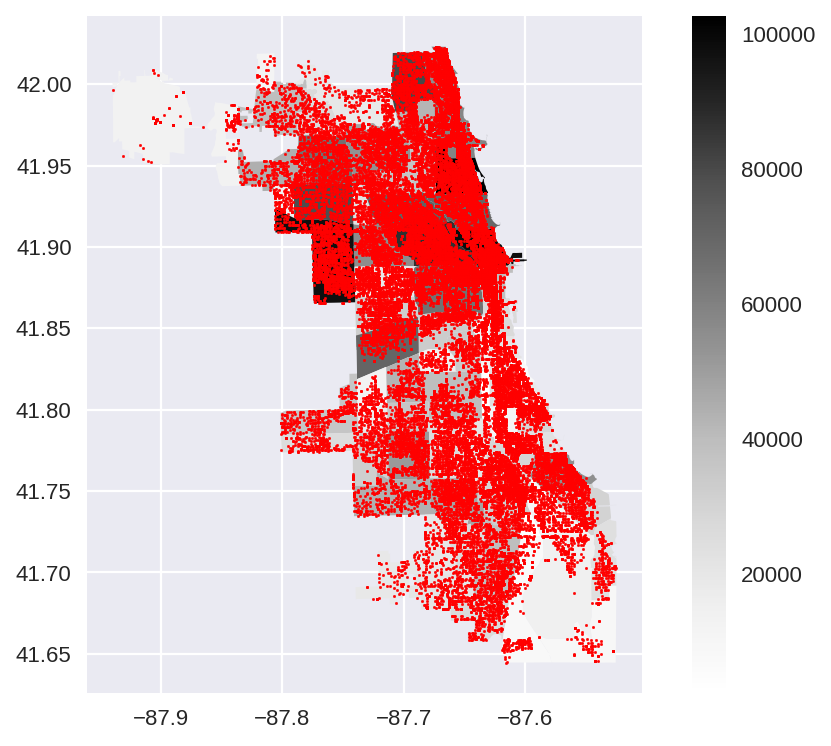

In [123]:
ax=theft.plot(color='r',markersize=1,zorder=2)
boundaries_data.plot(column='TOT_POP',ax=ax,zorder=1,legend=True)

Text(0.5, 1.0, 'Robbery')

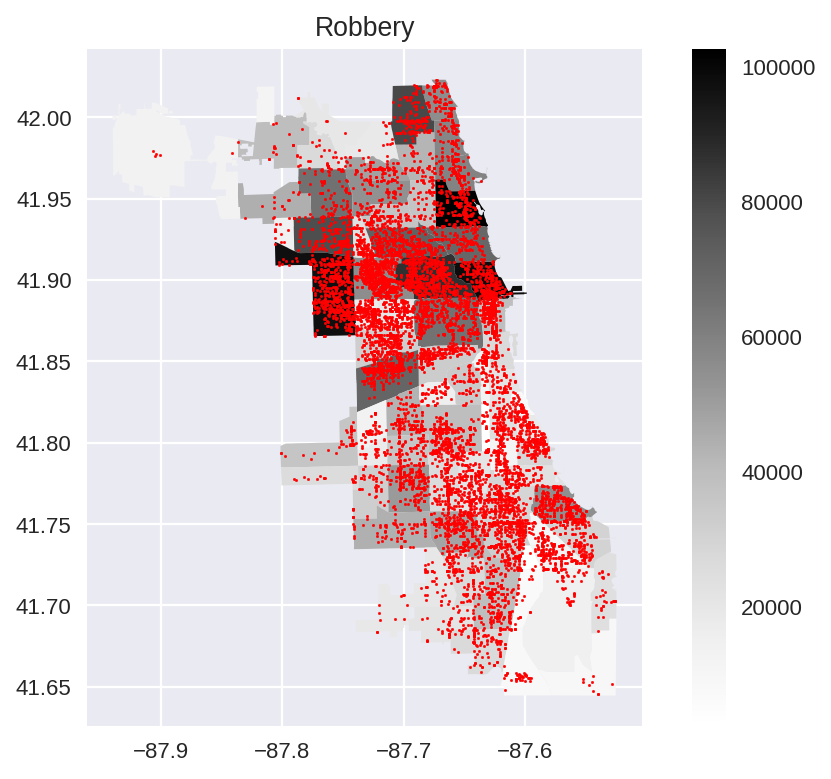

In [124]:
ax=robbery.plot(color='r',markersize=1,zorder=2)
boundaries_data.plot(column='TOT_POP',ax=ax,zorder=1,legend=True)
plt.title('Robbery')

Text(0.5, 1.0, 'Robbery')

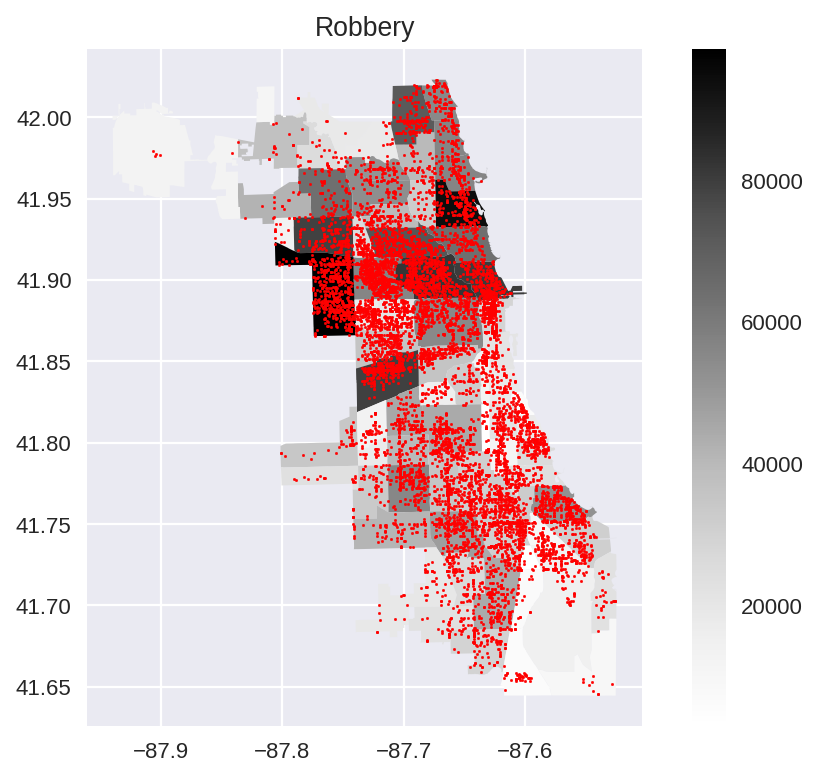

In [125]:
ax=robbery.plot(color='r',markersize=1,zorder=2)
boundaries_data.plot(column='2010_POP',ax=ax,zorder=1,legend=True)
plt.title('Robbery')

Text(0.5, 1.0, 'Robbery vs Income per cap')

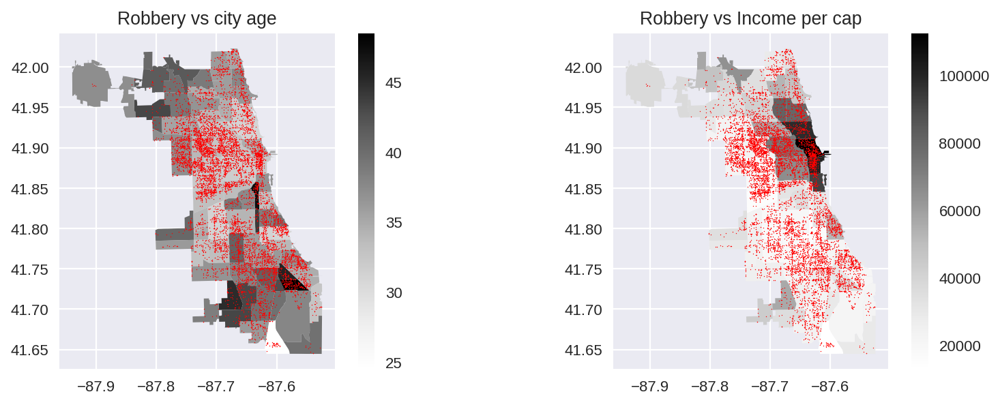

In [126]:
fig, axs = plt.subplots(1, 2, figsize=(12,4))
axs = np.ravel(axs)

i=0
robbery.plot(color='r',markersize=0.1,zorder=2, ax=axs[i])
boundaries_data.plot(column='MED_AGE',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('Robbery vs city age')

i=1
robbery.plot(color='r',markersize=0.1,zorder=2, ax=axs[i])
boundaries_data.plot(column='INCPERCAP',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('Robbery vs Income per cap')

Text(0.5, 1.0, 'Robbery vs Rent')

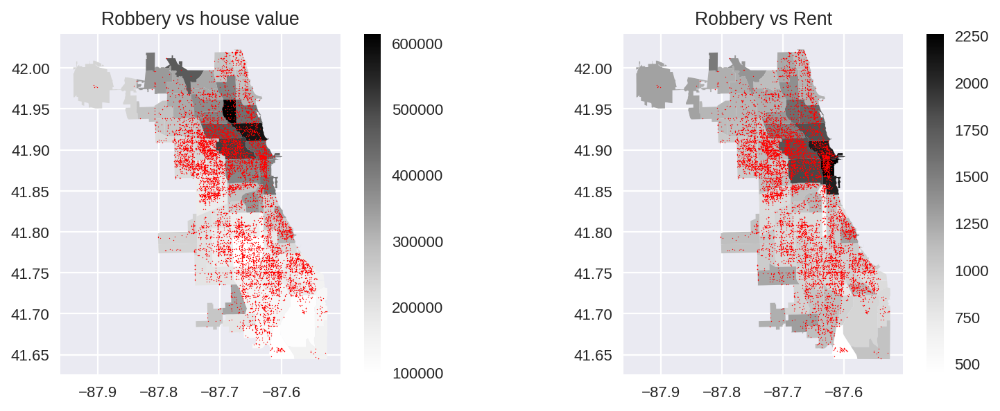

In [127]:
fig, axs = plt.subplots(1, 2, figsize=(12,4))
axs = np.ravel(axs)

i=0
robbery.plot(color='r',markersize=0.1,zorder=2, ax=axs[i])
boundaries_data.plot(column='MED_HV',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('Robbery vs house value')

i=1
robbery.plot(color='r',markersize=0.1,zorder=2, ax=axs[i])
boundaries_data.plot(column='MED_RENT',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('Robbery vs Rent')

In [128]:
theft_sample_1000=theft.sample(1000)

Text(0.5, 1.0, 'Theft vs Rent')

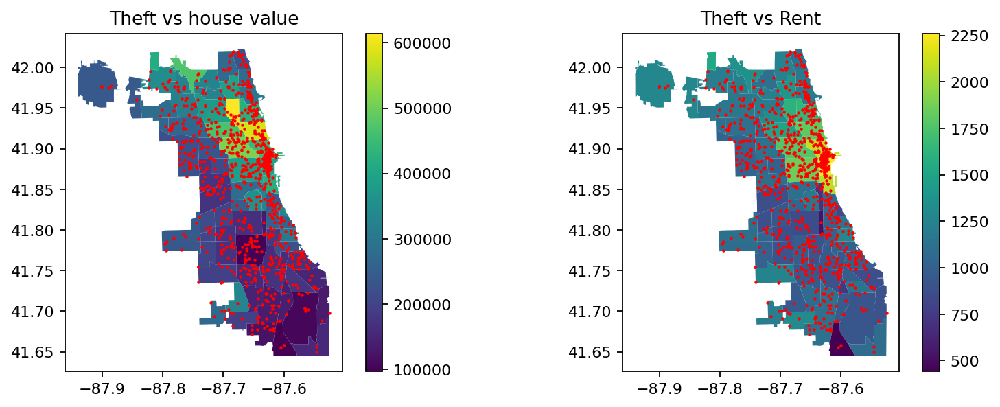

In [142]:
fig, axs = plt.subplots(1, 2, figsize=(12,4))
axs = np.ravel(axs)

i=0
theft_sample_1000.plot(color='r',markersize=1,zorder=2, ax=axs[i])
boundaries_data.plot(column='MED_HV',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('Theft vs house value')

i=1
theft_sample_1000.plot(color='r',markersize=1,zorder=2, ax=axs[i])
boundaries_data.plot(column='MED_RENT',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('Theft vs Rent')

Text(0.5, 1.0, 'all crime per capital')

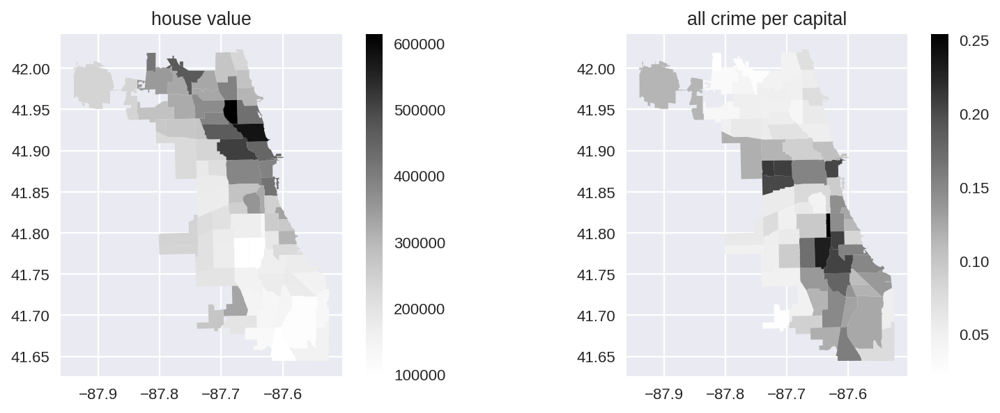

In [157]:
fig, axs = plt.subplots(1, 2, figsize=(12,4))
axs = np.ravel(axs)

i=0

boundaries_data.plot(column='MED_HV',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('house value')

i=1
# theft_sample_1000.plot(color='r',markersize=1,zorder=2, ax=axs[i])
boundaries_data.plot(column='crime_sum_percap',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('all crime per capital')

## join the agg crime data with eco


In [142]:
boundaries_data=boundaries_data.merge(crime_agg, how='left',left_on='community',right_on='community')

In [146]:
x

PRIMARY DESCRIPTION,community,ARSON,ASSAULT,BATTERY,BURGLARY,CONCEALED CARRY LICENSE VIOLATION,CRIMINAL DAMAGE,CRIMINAL SEXUAL ASSAULT,CRIMINAL TRESPASS,DECEPTIVE PRACTICE,...,OTHER OFFENSE,PROSTITUTION,PUBLIC INDECENCY,PUBLIC PEACE VIOLATION,ROBBERY,SEX OFFENSE,STALKING,THEFT,WEAPONS VIOLATION,crime_sum
0,ALBANY PARK,4.0,200.0,438.0,105.0,0.0,362.0,10.0,37.0,192.0,...,144.0,0.0,0.0,2.0,83.0,18.0,6.0,623.0,43.0,2501.0
1,ARCHER HEIGHTS,4.0,93.0,143.0,41.0,0.0,98.0,3.0,19.0,135.0,...,63.0,0.0,0.0,12.0,45.0,2.0,2.0,234.0,53.0,1024.0
2,ARMOUR SQUARE,2.0,83.0,159.0,37.0,0.0,142.0,0.0,18.0,64.0,...,31.0,0.0,0.0,5.0,97.0,4.0,1.0,255.0,41.0,1063.0
3,ASHBURN,6.0,201.0,338.0,75.0,1.0,263.0,11.0,42.0,186.0,...,155.0,0.0,0.0,4.0,78.0,12.0,8.0,382.0,88.0,2166.0
4,AUBURN GRESHAM,17.0,700.0,1324.0,236.0,5.0,874.0,31.0,109.0,258.0,...,468.0,0.0,0.0,18.0,274.0,27.0,19.0,950.0,346.0,6501.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,WEST LAWN,4.0,123.0,242.0,92.0,0.0,236.0,10.0,26.0,125.0,...,95.0,0.0,0.0,10.0,50.0,7.0,0.0,391.0,69.0,1693.0
73,WEST PULLMAN,9.0,330.0,640.0,86.0,2.0,463.0,13.0,56.0,147.0,...,236.0,0.0,0.0,5.0,95.0,14.0,6.0,486.0,221.0,3236.0
74,WEST RIDGE,9.0,305.0,591.0,172.0,0.0,425.0,15.0,74.0,414.0,...,225.0,0.0,0.0,3.0,131.0,28.0,3.0,851.0,56.0,3752.0
75,WEST TOWN,7.0,447.0,802.0,304.0,5.0,940.0,34.0,123.0,457.0,...,303.0,0.0,0.0,15.0,539.0,42.0,7.0,2464.0,93.0,7757.0


Text(0.5, 1.0, 'All crime')

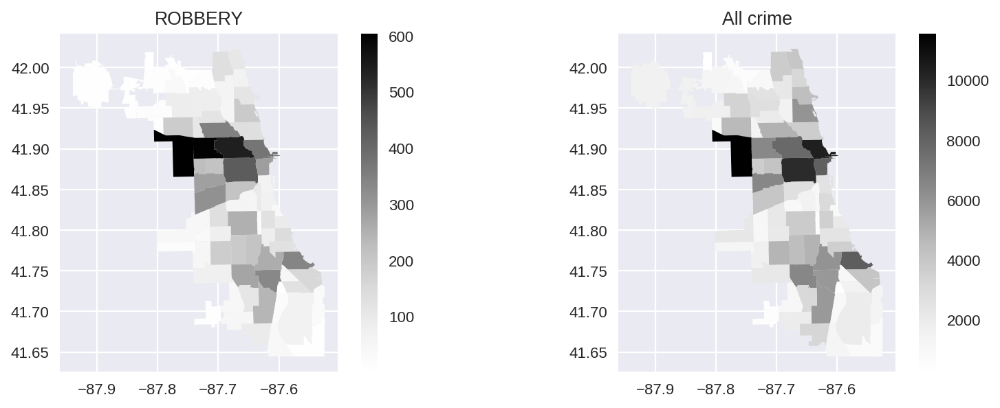

In [143]:
fig, axs = plt.subplots(1, 2, figsize=(12,4))
axs = np.ravel(axs)

i=0
# theft_sample_1000.plot(color='r',markersize=1,zorder=2, ax=axs[i])
boundaries_data.plot(column='ROBBERY',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('ROBBERY')

i=1
# theft_sample_1000.plot(color='r',markersize=1,zorder=2, ax=axs[i])
boundaries_data.plot(column='crime_sum',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('All crime')

## EV charge stations

In [57]:
ev_data=gpd.read_file('./data/Alternative_Fuel_Locations_20231024.csv')
ev_data['geometry']=ev_data['Location'].apply(string_to_points)

In [63]:
ev_data=ev_data[ev_data['City']=='Chicago']

In [65]:
# should change to use polygon filtering
ev_data['Latitude']=ev_data['Latitude'].astype(float)
ev_data['Longitude']=ev_data['Longitude'].astype(float)

ev_data=ev_data[ev_data['Latitude']>41.5]
ev_data=ev_data[ev_data['Latitude']<42.05]
ev_data=ev_data[ev_data['Longitude']>-88]
ev_data=ev_data[ev_data['Longitude']<-87.4]

In [60]:
ev_data_clean=ev_data.drop(1139)

Text(0.5, 1.0, 'EV vs Rent')

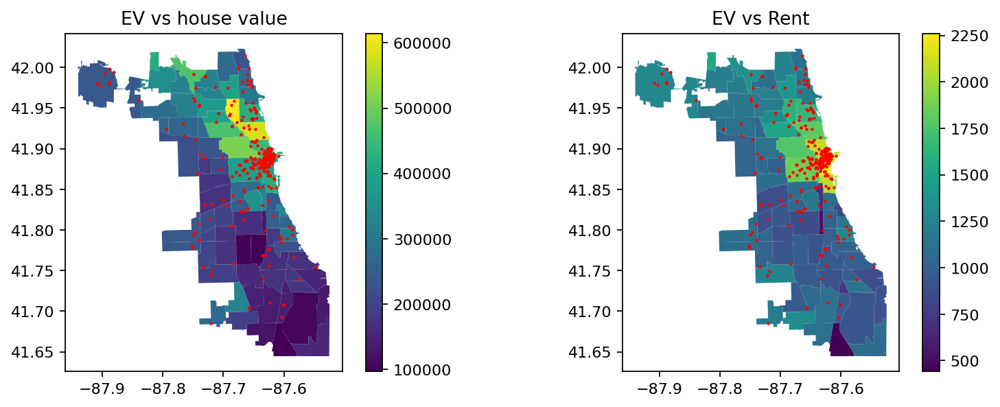

In [67]:
fig, axs = plt.subplots(1, 2, figsize=(12,4))
axs = np.ravel(axs)

i=0
ev_data.plot(color='r',markersize=1,zorder=2, ax=axs[i])
boundaries_data.plot(column='MED_HV',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('EV vs house value')

i=1
ev_data.plot(color='r',markersize=1,zorder=2, ax=axs[i])
boundaries_data.plot(column='MED_RENT',ax=axs[i],zorder=1,legend=True)
axs[i].set_title('EV vs Rent')

## CRIME Correlation

In [2]:
crime_agg.sum()[1:].sort_values()

NameError: name 'crime_agg' is not defined

In [144]:
boundaries_data['crime_sum_percap']=boundaries_data['crime_sum']/boundaries_data['TOT_POP']

In [158]:
boundaries_data['crime_sum_percap_log']=boundaries_data['crime_sum']/np.log(boundaries_data['TOT_POP'])

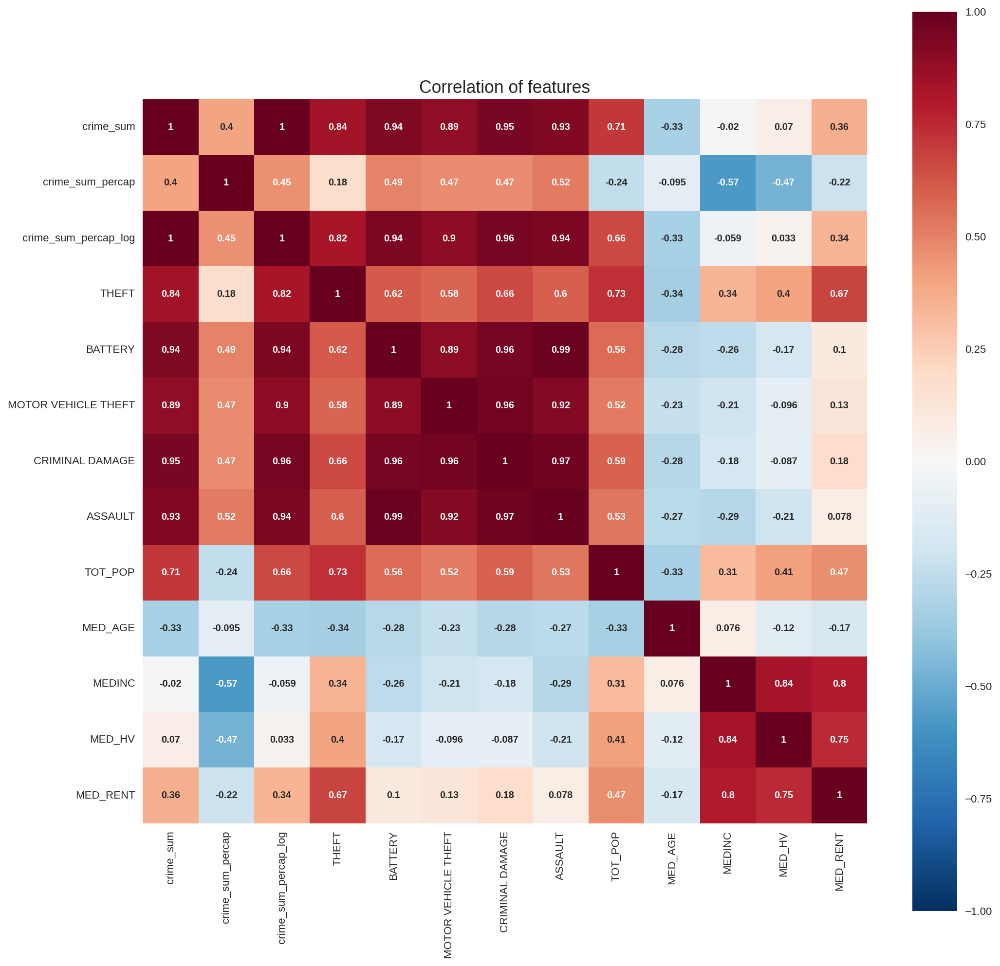

In [159]:
columns=['crime_sum','crime_sum_percap','crime_sum_percap_log','THEFT','BATTERY','MOTOR VEHICLE THEFT','CRIMINAL DAMAGE',
         'ASSAULT','TOT_POP','MED_AGE','MEDINC','MED_HV','MED_RENT']
plt.figure(figsize=(15, 15))
plt.title('Correlation of features', size=16)
sns.heatmap(
    boundaries_data[columns].corr(), vmax=1.0, vmin=-1.0, square=True, cmap='RdBu_r', linecolor='white',
    annot=True, annot_kws={'size': 9, 'weight': 'bold'}, 
)

plt.show()

Text(0.5, 1.0, 'crime vs crime rate log')

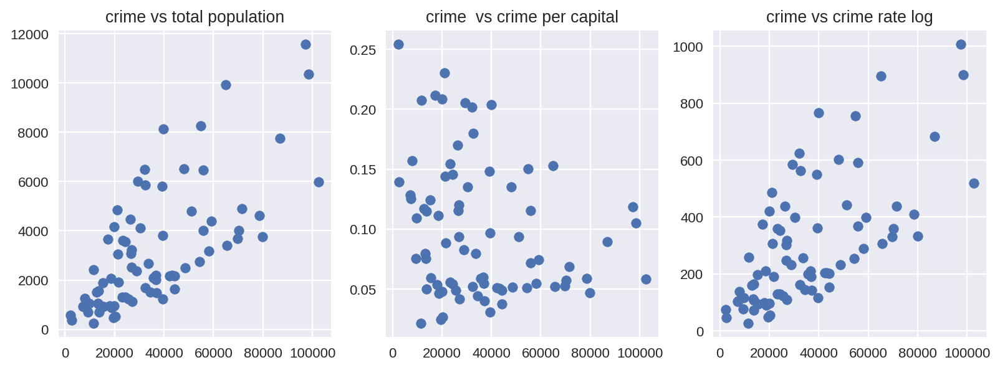

In [168]:
fig, axs = plt.subplots(1, 3, figsize=(12,4))
axs = np.ravel(axs)
i=0
plt.sca(axs[i])
plt.scatter(boundaries_data['TOT_POP'],boundaries_data['crime_sum'])
plt.title('crime vs total population')

i=1
plt.sca(axs[i])
plt.scatter(boundaries_data['TOT_POP'],boundaries_data['crime_sum_percap'])
plt.title('crime  vs crime per capital')

i=2
plt.sca(axs[i])
plt.scatter(boundaries_data['TOT_POP'],boundaries_data['crime_sum_percap_log'])
plt.title('crime vs crime rate log')

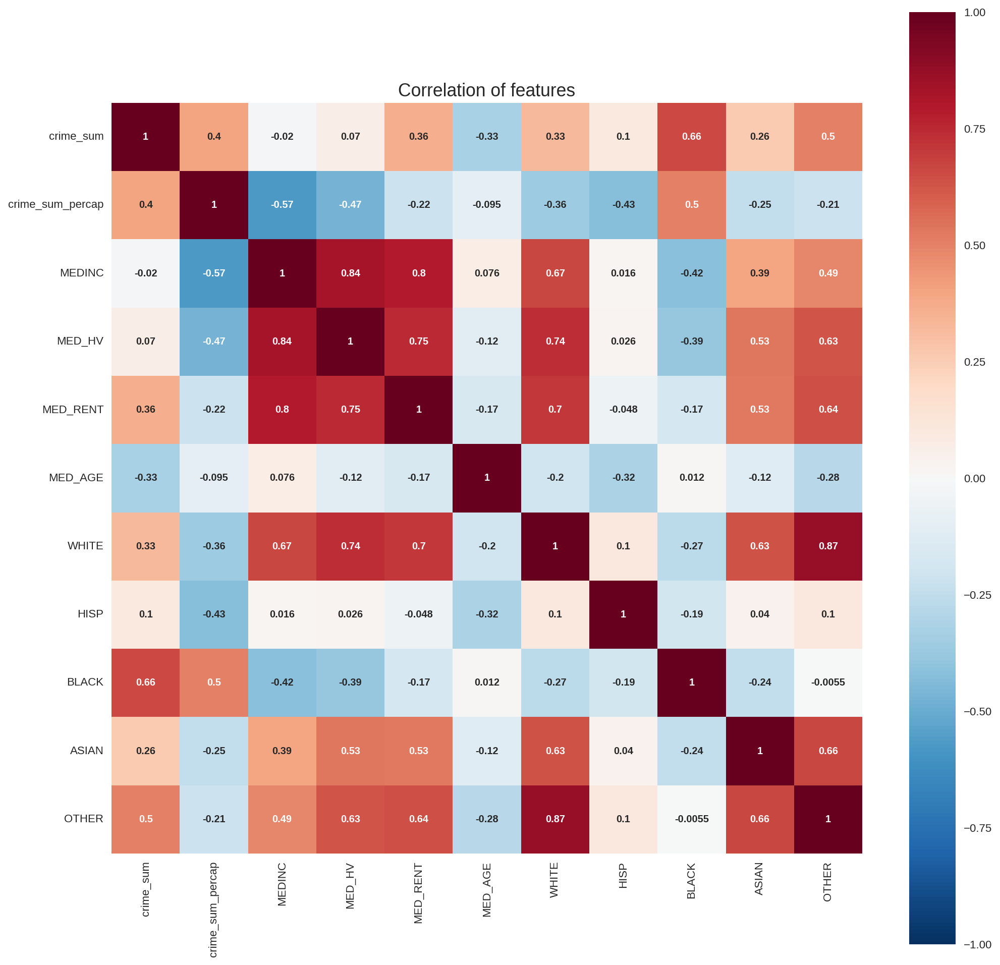

In [149]:
columns=['crime_sum','crime_sum_percap','MEDINC','MED_HV','MED_RENT','MED_AGE','WHITE','HISP','BLACK','ASIAN','OTHER']
plt.figure(figsize=(15, 15))
plt.title('Correlation of features', size=16)
sns.heatmap(
    boundaries_data[columns].corr(), vmax=1.0, vmin=-1.0, square=True, cmap='RdBu_r', linecolor='white',
    annot=True, annot_kws={'size': 9, 'weight': 'bold'}, 
)

plt.show()

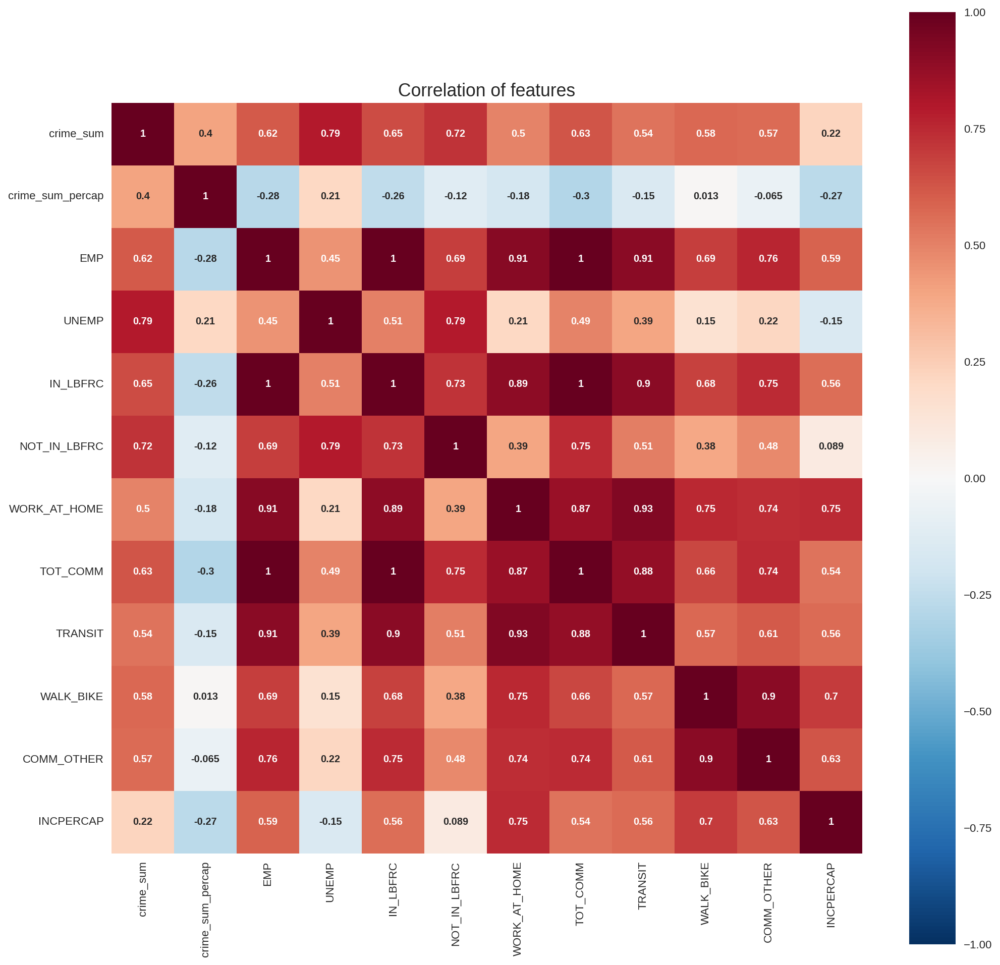

In [153]:
columns=['crime_sum','crime_sum_percap','EMP','UNEMP','IN_LBFRC','NOT_IN_LBFRC','WORK_AT_HOME','TOT_COMM','TRANSIT','WALK_BIKE','COMM_OTHER','INCPERCAP']
plt.figure(figsize=(15, 15))
plt.title('Correlation of features', size=16)
sns.heatmap(
    boundaries_data[columns].corr(), vmax=1.0, vmin=-1.0, square=True, cmap='RdBu_r', linecolor='white',
    annot=True, annot_kws={'size': 9, 'weight': 'bold'}, 
)

plt.show()

In [1]:
crime_data

NameError: name 'crime_data' is not defined